### Drive Mounting

In [1]:
from google.colab import drive
drive.mount('./MyDrive')

Mounted at ./MyDrive


In [2]:
cd MyDrive/My Drive/Colab Notebooks/project

/content/MyDrive/My Drive/Colab Notebooks/project


### Package Loading

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import random_split

from torchvision import transforms
from torchvision.datasets import STL10
from torchsummary import summary

from tqdm.notebook import tqdm
import time

### Parameter Setting

In [4]:
class Config:
    seed = 42
    device = "cuda"if torch.cuda.is_available() else 'cpu'

    teacher_epochs = 500
    student_epochs = 100
    batch_size = 100
    n_classes = 10

    lambd = 3
    dim_noise = 100
    image_size = (3, 64, 64)

    d_g_lr = 0.0002
    d_g_beta1 = 0.5

    s_lr = 0.0002
    s_beta1 = 0.5

    g_path = "./checkpoint/pseudo_labels/Generator.pt"
    d_path = "./checkpoint/pseudo_labels/Discriminator.pt"
    s_path = "./checkpoint/pseudo_labels/Student(ResNet50).pt"

    teacher_history_path = "./history/pseudo_labels/teacher_history.csv"
    student_history_path = "./history/pseudo_labels/student_history(ResNet50).csv"

print(Config.device)

cuda


In [5]:
def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)  
    torch.backends.cudnn.deterministic = True  
    torch.backends.cudnn.benchmark = True 

In [6]:
seed_everything(Config.seed)

### Data Loading

In [7]:
transform = transforms.Compose([transforms.RandomCrop((64, 64)),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                ])

In [8]:
train_ds = STL10('./data', split='train', download=True, transform=transform)
unlabeled_ds = STL10('./data', split='unlabeled', download=True, transform=transform)
test_ds = STL10('./data', split='test', download=True, transform=transform)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [9]:
train_set, valid_set = random_split(train_ds, [4000, 1000])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


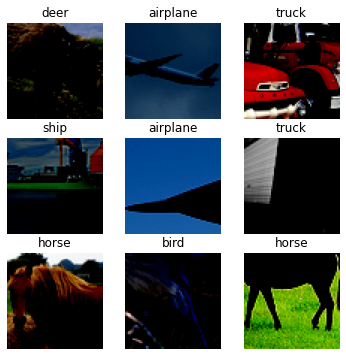

In [10]:
figure = plt.figure(figsize=(6, 6))

classes = ('airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck')
cols, rows = 3, 3

for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_set), size=(1,)).item()
    img, label = train_set[sample_idx]
    figure.add_subplot(rows, cols, i)
    plt.title(classes[label])
    plt.axis("off")
    plt.imshow(np.transpose(img, (1, 2, 0)))
plt.show()

In [11]:
print("labeld size: %d" % (len(train_set)))
print("unlabeld size: %d" % (len(unlabeled_ds)))
print("validation size: %d" % (len(valid_set)))
print("test size: %d" % (len(test_ds)))

labeld size: 4000
unlabeld size: 100000
validation size: 1000
test size: 8000


In [12]:
labeled_dl = DataLoader(train_set, batch_size=Config.batch_size, shuffle=True)
unlabeled_dl = DataLoader(unlabeled_ds, batch_size=len(train_set), shuffle=True)
valid_dl = DataLoader(valid_set, batch_size=Config.batch_size,)
test_dl = DataLoader(test_ds, batch_size=Config.batch_size)

### Model Defining

Teacher(DCGAN)

In [13]:
class Generator(nn.Module):
    def __init__(self, dim_noise):
        super(Generator, self).__init__()

        self.layers = nn.Sequential(
            nn.ConvTranspose2d(dim_noise, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

        self.initialize_weights()

    def initialize_weights(self):
        for i in self.modules():
          if isinstance(i, nn.ConvTranspose2d):
              nn.init.normal_(i.weight, mean=0.0, std=0.02)
          elif isinstance(i, nn.BatchNorm2d):
              nn.init.normal_(i.weight, mean=1.0, std=0.02)
              nn.init.constant_(i.bias, 0)

    def forward(self, inputs):
        output = self.layers(inputs)

        return output

In [14]:
g_model = Generator(dim_noise=Config.dim_noise).to(Config.device)

summary(g_model, input_size = (Config.dim_noise, 1, 1))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]         819,200
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,152
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,288
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,072
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           3,072
             Tanh-14            [-1, 3,

In [15]:
class Discriminator(nn.Module):
    def __init__(self, n_classes):
        super(Discriminator, self).__init__()

        self.layers = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 10, kernel_size=4, stride=1, padding=0, bias=False),
        )

        self.softmax = nn.Softmax(-1)


        self.initialize_weights()

    def initialize_weights(self):
        for i in self.modules():
          if isinstance(i, nn.Conv2d):
              nn.init.normal_(i.weight, mean=0.0, std=0.02)
          elif isinstance(i, nn.BatchNorm2d):
              nn.init.normal_(i.weight, mean=1.0, std=0.02)
              nn.init.constant_(i.bias, 0)

    def forward(self, inputs):
        x = self.layers(inputs)
        x = x.view(x.shape[0], -1)
        outputs = self.softmax(x)
        return outputs

In [16]:
d_model = Discriminator(n_classes=Config.n_classes).to(Config.device)

summary(d_model, input_size = Config.image_size)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,072
       BatchNorm2d-2           [-1, 64, 32, 32]             128
         LeakyReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4          [-1, 128, 16, 16]         131,072
       BatchNorm2d-5          [-1, 128, 16, 16]             256
         LeakyReLU-6          [-1, 128, 16, 16]               0
            Conv2d-7            [-1, 256, 8, 8]         524,288
       BatchNorm2d-8            [-1, 256, 8, 8]             512
         LeakyReLU-9            [-1, 256, 8, 8]               0
           Conv2d-10            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-11            [-1, 512, 4, 4]           1,024
        LeakyReLU-12            [-1, 512, 4, 4]               0
           Conv2d-13             [-1, 10, 1, 1]          81,920
          Softmax-14                   

Student(ResNet50)

In [17]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels, mid_channels, out_channels, stride):
        super(ResidualBlock, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=1, stride=stride, padding=0, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, mid_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(out_channels),
        )

        if in_channels != out_channels:
          self.projection = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, padding=0, bias=False),
            nn.BatchNorm2d(out_channels)
          )

        else:
          self.projection = nn.Sequential()

        self.activation = nn.ReLU(inplace=True)

    def forward(self, inputs):
        x = self.conv_layers(inputs)
        skip_connection = self.projection(inputs)
        x += skip_connection
        outputs = self.activation(x)
        
        return outputs

In [18]:
class ResNet50(nn.Module):
    def __init__(self, n_classes):
      super(ResNet50, self).__init__()

      self.conv_1 = nn.Sequential(
        nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(inplace=True)
      )

      self.conv_2 = self.make_block(64, 64, 256, 3, True)
      
      self.conv_3 = self.make_block(256, 128 , 512, 4, True)
      
      self.conv_4 = self.make_block(512, 256, 1024, 6, True)

      self.conv_5 = self.make_block(1024, 512, 2048, 3, True)

      self.avg_pooling = nn.AvgPool2d(kernel_size=4, stride=1)

      self.classifier = nn.Sequential(
          nn.Linear(2048, n_classes),
          nn.Softmax(-1)
      )

      self.initialize_weights()

    def make_block(self, in_channels, mid_channels, out_channels, reps, downsampling):
      outputs = []
      
      if downsampling:
        outputs.append(ResidualBlock(in_channels, mid_channels, out_channels, 2))
      
      else:
        outputs.append(ResidualBlock(in_channels, mid_channels, out_channels, 1))

      for i in range(reps-1):
        outputs.append(ResidualBlock(out_channels, mid_channels, out_channels, 1))

      return nn.Sequential(*outputs)

    def initialize_weights(self):
      for i in self.modules():
        if isinstance(i, nn.Conv2d):
            nn.init.kaiming_normal_(i.weight, mode='fan_in', nonlinearity='relu')
        elif isinstance(i, nn.Linear):
            nn.init.kaiming_normal_(i.weight, mode='fan_in', nonlinearity='relu')
            nn.init.constant_(i.bias, 0)
        elif isinstance(i, nn.BatchNorm2d):
            nn.init.normal_(i.weight, mean=1.0, std=0.02)
            nn.init.constant_(i.bias, 0)

    def forward(self, inputs):
      x = self.conv_1(inputs)
      x = self.conv_2(x)
      x = self.conv_3(x)
      x = self.conv_4(x)
      x = self.conv_5(x)
      x = self.avg_pooling(x)
      x = x.view(x.shape[0], -1)
      outputs = self.classifier(x)
        
      return outputs

In [19]:
s_model = ResNet50(n_classes=Config.n_classes).to(Config.device)

summary(s_model, input_size = (Config.image_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,728
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
            Conv2d-4           [-1, 64, 32, 32]           4,096
       BatchNorm2d-5           [-1, 64, 32, 32]             128
              ReLU-6           [-1, 64, 32, 32]               0
            Conv2d-7           [-1, 64, 32, 32]          36,864
       BatchNorm2d-8           [-1, 64, 32, 32]             128
              ReLU-9           [-1, 64, 32, 32]               0
           Conv2d-10          [-1, 256, 32, 32]          16,384
      BatchNorm2d-11          [-1, 256, 32, 32]             512
           Conv2d-12          [-1, 256, 32, 32]          16,384
      BatchNorm2d-13          [-1, 256, 32, 32]             512
             ReLU-14          [-1, 256,

### Training Setting

In [20]:
class MarginalHLoss(nn.Module):
  def __init__(self):
    super(MarginalHLoss, self).__init__()

  def forward(self, x):
    x = x.mean(axis=0)
    x = -torch.sum(x*torch.log(x+1e-6))
    
    return x

In [21]:
class JointHLoss(nn.Module):
  def __init__(self):
    super(JointHLoss, self).__init__()

  def forward(self, x):
    x = -x*torch.log(x+1e-6)
    x = 1.0/Config.batch_size*x.sum()
    
    return x

In [22]:
cross_entropy = nn.CrossEntropyLoss(reduction='mean')
marginal_entropy = MarginalHLoss()
joint_entropy = JointHLoss()

d_optimizer = optim.Adam(d_model.parameters(), lr=Config.d_g_lr, betas=(Config.d_g_beta1, 0.999))
g_optimizer = optim.Adam(g_model.parameters(), lr=Config.d_g_lr, betas=(Config.d_g_beta1, 0.999))
s_optimizer = optim.Adam(s_model.parameters(), lr=Config.s_lr, betas=(Config.s_beta1, 0.999))

In [23]:
def teacher_training(g_model, d_model, g_optimizer, d_optimizer, lambd, epochs, g_path, d_path, history_path, labeled_dl, unlabeled_dl, valid_dl):
    history = {'G_loss':[], 'D_loss':[], 'D_valid_acc':[]}        
    start_time = time.time()

    current_label_epoch = 0;
    
    for unlabel_iter in range(int(epochs/len(unlabeled_dl))): 
        for unlabeled_batch, _ in unlabeled_dl:
            epoch_time = time.time()

            total_G_loss = 0
            total_D_loss = 0
            
            d_model.train()
            for (labeled_inputs, labels), i in tqdm(zip(labeled_dl, range(len(labeled_dl))), total=len(labeled_dl), desc="Training", leave=False):
                labeled_inputs, labels = labeled_inputs.to(Config.device), labels.to(Config.device)
                unlabeled_inputs = unlabeled_batch[i*Config.batch_size:(i+1)*Config.batch_size].to(Config.device)

                unlabeled_inputs = unlabeled_batch[i*Config.batch_size:(i+1)*Config.batch_size].to(Config.device)
                d_unlabeled_outputs = d_model(unlabeled_inputs)

                noise = torch.randn(Config.batch_size, Config.dim_noise, 1, 1).to(Config.device)
                fake_inputs = g_model(noise)

                # Train d_model
                d_optimizer.zero_grad()

                d_labeled_outputs = d_model(labeled_inputs)
                d_fake_outputs = d_model(fake_inputs.detach())

                d_cross_entropy_labeled = cross_entropy(d_labeled_outputs, labels) # D_loss term3
                d_joint_entropy_unlabeled = joint_entropy(d_unlabeled_outputs) # D_loss term2
                d_joint_entropy_fake = joint_entropy(d_fake_outputs) # D_loss term4
                d_marginal_entropy_unlabeled = marginal_entropy(d_unlabeled_outputs)

                d_loss = (lambd * d_cross_entropy_labeled) + d_joint_entropy_unlabeled - d_joint_entropy_fake - d_marginal_entropy_unlabeled
                d_loss.backward(retain_graph=True)
                d_optimizer.step()

                total_D_loss += d_loss.item()

                # Train g_model
                g_optimizer.zero_grad()

                d_outputs = d_model(fake_inputs)

                g_joint_entropy = joint_entropy(d_outputs)
                g_marginal_entropy = marginal_entropy(d_outputs)

                g_loss = g_joint_entropy - g_marginal_entropy
                g_loss.backward(retain_graph=True)
                g_optimizer.step()

                total_G_loss += g_loss.item()

            G_loss = total_G_loss / len(labeled_dl)
            D_loss = total_D_loss / len(labeled_dl)

            history['G_loss'].append(G_loss)
            history['D_loss'].append(D_loss)

            valid_total = 0
            valid_correct = 0

            d_model.eval()
            with torch.no_grad():
              for inputs, labels in tqdm(valid_dl, desc="Validation", leave=False):
                  inputs, labels = inputs.to(Config.device), labels.to(Config.device)
                  outputs = d_model(inputs)
                  _, predicted = torch.max(outputs.data, 1)

                  valid_total += labels.size(0)
                  valid_correct += (predicted == labels).sum().item()

            valid_acc = valid_correct / valid_total * 100

            history['D_valid_acc'].append(valid_acc)

            current_label_epoch += 1
            tqdm.write('[Epoch : %d/%d] G_loss: %.5f, D_loss: %.5f, D_valid_acc: %.2f, elapsed_time_in_epoch: %02d:%02d' % (current_label_epoch, epochs, G_loss, D_loss, valid_acc, (time.time()-epoch_time)/60, (time.time()-epoch_time)%60))

            torch.save(g_model.state_dict(), g_path)
            torch.save(d_model.state_dict(), d_path)

    print('Finished training')
    print('Total elapsed time: %02d:%02d' % ((time.time()-start_time)/60, (time.time()-start_time)%60))

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_path)

    return g_model, d_model, history

In [24]:
def student_training(d_model, s_model, s_optimizer, epochs, s_path, history_path, labeled_dl, unlabeled_dl, valid_dl):
    history = {'S_loss':[], 'S_valid_acc':[]}        
    start_time = time.time()

    current_label_epoch = 0;
    
    d_model.eval()
    for unlabel_iter in range(int(epochs/len(unlabeled_dl))): 
        for unlabeled_batch, _ in unlabeled_dl:
            epoch_time = time.time()

            total_S_loss = 0

            s_model.train()
            for (labeled_inputs, labels), i in tqdm(zip(labeled_dl, range(len(labeled_dl))), total=len(labeled_dl), desc="Training", leave=False):
                labeled_inputs, labels = labeled_inputs.to(Config.device), labels.to(Config.device)
                unlabeled_inputs = unlabeled_batch[i*Config.batch_size:(i+1)*Config.batch_size].to(Config.device)

                d_unlabeled_outputs = d_model(unlabeled_inputs)
                _, pseudo_labels = torch.max(d_unlabeled_outputs.detach().data, 1)

                s_optimizer.zero_grad()

                s_unlabeled_outputs = s_model(unlabeled_inputs)
                s_labeled_outputs = s_model(labeled_inputs)

                s_cross_entropy_unlabeled = cross_entropy(s_unlabeled_outputs, pseudo_labels)
                s_cross_entropy_labeled = cross_entropy(s_labeled_outputs, labels)

                s_loss = s_cross_entropy_unlabeled + s_cross_entropy_labeled
                s_loss.backward(retain_graph=True)
                s_optimizer.step()

                total_S_loss += s_loss.item()

            S_loss = total_S_loss / len(labeled_dl)

            history['S_loss'].append(S_loss)

            valid_total = 0
            valid_correct = 0

            s_model.eval()
            with torch.no_grad():
              for inputs, labels in tqdm(valid_dl, desc="Validation", leave=False):
                  inputs, labels = inputs.to(Config.device), labels.to(Config.device)
                  outputs = s_model(inputs)
                  _, predicted = torch.max(outputs.data, 1)

                  valid_total += labels.size(0)
                  valid_correct += (predicted == labels).sum().item()

            valid_acc = valid_correct / valid_total * 100

            history['S_valid_acc'].append(valid_acc)

            current_label_epoch += 1
            tqdm.write('[Epoch : %d/%d] S_loss: %.5f, S_valid_acc: %.2f, elapsed_time_in_epoch: %02d:%02d' % (current_label_epoch, epochs, S_loss, valid_acc, (time.time()-epoch_time)/60, (time.time()-epoch_time)%60))

            torch.save(s_model.state_dict(), s_path)

    print('Finished training')
    print('Total elapsed time: %02d:%02d' % ((time.time()-start_time)/60, (time.time()-start_time)%60))

    history_df = pd.DataFrame(history)
    history_df.to_csv(history_path)

    return s_model, history

### Training Teacher

In [ ]:
g_model, d_model, teacher_history = teacher_training(g_model, d_model, g_optimizer, d_optimizer, Config.lambd, Config.teacher_epochs, Config.g_path, Config.d_path, Config.teacher_history_path, labeled_dl, unlabeled_dl, valid_dl)

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 1/500] G_loss: -0.42131, D_loss: 3.72693, D_valid_acc: 20.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 2/500] G_loss: -0.42360, D_loss: 3.43649, D_valid_acc: 23.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 3/500] G_loss: -0.41675, D_loss: 3.39264, D_valid_acc: 24.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 4/500] G_loss: -0.39185, D_loss: 3.34942, D_valid_acc: 25.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 5/500] G_loss: -0.47938, D_loss: 3.30054, D_valid_acc: 22.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 6/500] G_loss: -0.60702, D_loss: 3.51263, D_valid_acc: 24.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 7/500] G_loss: -0.54531, D_loss: 3.31549, D_valid_acc: 28.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 8/500] G_loss: -0.50989, D_loss: 3.27572, D_valid_acc: 26.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 9/500] G_loss: -0.45143, D_loss: 3.11848, D_valid_acc: 32.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 10/500] G_loss: -0.44651, D_loss: 3.09496, D_valid_acc: 29.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 11/500] G_loss: -0.47453, D_loss: 3.13877, D_valid_acc: 26.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 12/500] G_loss: -0.44905, D_loss: 3.01814, D_valid_acc: 32.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 13/500] G_loss: -0.49605, D_loss: 3.17321, D_valid_acc: 31.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 14/500] G_loss: -0.55701, D_loss: 3.24592, D_valid_acc: 34.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 15/500] G_loss: -0.48697, D_loss: 3.12541, D_valid_acc: 37.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 16/500] G_loss: -0.56528, D_loss: 3.22541, D_valid_acc: 31.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 17/500] G_loss: -0.47887, D_loss: 3.06089, D_valid_acc: 33.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 18/500] G_loss: -0.45028, D_loss: 2.99783, D_valid_acc: 33.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 19/500] G_loss: -0.51146, D_loss: 3.11601, D_valid_acc: 35.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 20/500] G_loss: -0.45998, D_loss: 2.99984, D_valid_acc: 36.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 21/500] G_loss: -0.42420, D_loss: 2.92063, D_valid_acc: 36.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 22/500] G_loss: -0.45979, D_loss: 2.98237, D_valid_acc: 39.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 23/500] G_loss: -0.39886, D_loss: 2.75628, D_valid_acc: 36.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 24/500] G_loss: -0.39702, D_loss: 2.76504, D_valid_acc: 39.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 25/500] G_loss: -0.32526, D_loss: 2.56119, D_valid_acc: 38.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 26/500] G_loss: -0.29954, D_loss: 2.52999, D_valid_acc: 39.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 27/500] G_loss: -0.27948, D_loss: 2.46824, D_valid_acc: 40.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 28/500] G_loss: -0.31524, D_loss: 2.52346, D_valid_acc: 39.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 29/500] G_loss: -0.30476, D_loss: 2.46762, D_valid_acc: 38.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 30/500] G_loss: -0.35640, D_loss: 2.62644, D_valid_acc: 36.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 31/500] G_loss: -0.35350, D_loss: 2.62935, D_valid_acc: 41.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 32/500] G_loss: -0.32601, D_loss: 2.54262, D_valid_acc: 42.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 33/500] G_loss: -0.25209, D_loss: 2.30417, D_valid_acc: 40.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 34/500] G_loss: -0.27614, D_loss: 2.30331, D_valid_acc: 41.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 35/500] G_loss: -0.25219, D_loss: 2.26956, D_valid_acc: 40.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 36/500] G_loss: -0.22686, D_loss: 2.17825, D_valid_acc: 42.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 37/500] G_loss: -0.24187, D_loss: 2.23922, D_valid_acc: 40.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 38/500] G_loss: -0.27120, D_loss: 2.32886, D_valid_acc: 43.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 39/500] G_loss: -0.26495, D_loss: 2.29068, D_valid_acc: 43.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 40/500] G_loss: -0.21271, D_loss: 2.13311, D_valid_acc: 44.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 41/500] G_loss: -0.20305, D_loss: 2.08802, D_valid_acc: 38.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 42/500] G_loss: -0.19066, D_loss: 2.07018, D_valid_acc: 41.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 43/500] G_loss: -0.19757, D_loss: 2.10300, D_valid_acc: 41.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 44/500] G_loss: -0.18525, D_loss: 2.03124, D_valid_acc: 44.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 45/500] G_loss: -0.24968, D_loss: 2.25802, D_valid_acc: 45.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 46/500] G_loss: -0.26905, D_loss: 2.37191, D_valid_acc: 44.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 47/500] G_loss: -0.19226, D_loss: 2.00567, D_valid_acc: 41.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 48/500] G_loss: -0.30020, D_loss: 2.36099, D_valid_acc: 45.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 49/500] G_loss: -0.19662, D_loss: 1.98771, D_valid_acc: 41.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 50/500] G_loss: -0.18704, D_loss: 1.94133, D_valid_acc: 43.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 51/500] G_loss: -0.18846, D_loss: 1.99401, D_valid_acc: 44.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 52/500] G_loss: -0.18143, D_loss: 1.95981, D_valid_acc: 49.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 53/500] G_loss: -0.25020, D_loss: 2.18613, D_valid_acc: 43.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 54/500] G_loss: -0.16374, D_loss: 1.95996, D_valid_acc: 44.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 55/500] G_loss: -0.16821, D_loss: 1.92999, D_valid_acc: 47.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 56/500] G_loss: -0.17504, D_loss: 1.92626, D_valid_acc: 48.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 57/500] G_loss: -0.22475, D_loss: 2.01135, D_valid_acc: 46.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 58/500] G_loss: -0.23736, D_loss: 2.04596, D_valid_acc: 48.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 59/500] G_loss: -0.37002, D_loss: 2.33811, D_valid_acc: 39.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 60/500] G_loss: -0.26093, D_loss: 2.19122, D_valid_acc: 44.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 61/500] G_loss: -0.14371, D_loss: 1.80781, D_valid_acc: 49.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 62/500] G_loss: -0.21106, D_loss: 2.02878, D_valid_acc: 47.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 63/500] G_loss: -0.20811, D_loss: 1.98887, D_valid_acc: 45.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 64/500] G_loss: -0.23629, D_loss: 2.05772, D_valid_acc: 46.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 65/500] G_loss: -0.20285, D_loss: 1.94542, D_valid_acc: 46.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 66/500] G_loss: -0.17426, D_loss: 1.86085, D_valid_acc: 46.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 67/500] G_loss: -0.21422, D_loss: 1.89877, D_valid_acc: 45.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 68/500] G_loss: -0.15612, D_loss: 1.81989, D_valid_acc: 45.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 69/500] G_loss: -0.14938, D_loss: 1.77872, D_valid_acc: 47.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 70/500] G_loss: -0.15723, D_loss: 1.77747, D_valid_acc: 50.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 71/500] G_loss: -0.15758, D_loss: 1.77234, D_valid_acc: 50.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 72/500] G_loss: -0.16563, D_loss: 1.85140, D_valid_acc: 50.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 73/500] G_loss: -0.23721, D_loss: 2.03279, D_valid_acc: 33.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 74/500] G_loss: -0.30568, D_loss: 2.35310, D_valid_acc: 47.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 75/500] G_loss: -0.18989, D_loss: 1.88651, D_valid_acc: 46.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 76/500] G_loss: -0.17543, D_loss: 1.83032, D_valid_acc: 49.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 77/500] G_loss: -0.16396, D_loss: 1.73856, D_valid_acc: 47.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 78/500] G_loss: -0.17553, D_loss: 1.80053, D_valid_acc: 49.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 79/500] G_loss: -0.21346, D_loss: 1.92235, D_valid_acc: 47.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 80/500] G_loss: -0.15700, D_loss: 1.75844, D_valid_acc: 51.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 81/500] G_loss: -0.23286, D_loss: 2.01891, D_valid_acc: 44.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 82/500] G_loss: -0.17873, D_loss: 1.77332, D_valid_acc: 46.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 83/500] G_loss: -0.17334, D_loss: 1.76160, D_valid_acc: 49.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 84/500] G_loss: -0.22538, D_loss: 1.94661, D_valid_acc: 43.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 85/500] G_loss: -0.22246, D_loss: 1.94356, D_valid_acc: 49.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 86/500] G_loss: -0.13003, D_loss: 1.66128, D_valid_acc: 46.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 87/500] G_loss: -0.20820, D_loss: 1.93254, D_valid_acc: 48.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 88/500] G_loss: -0.16396, D_loss: 1.73979, D_valid_acc: 50.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 89/500] G_loss: -0.19593, D_loss: 1.82934, D_valid_acc: 50.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 90/500] G_loss: -0.18388, D_loss: 1.82202, D_valid_acc: 50.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 91/500] G_loss: -0.29359, D_loss: 1.90201, D_valid_acc: 41.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 92/500] G_loss: -0.56816, D_loss: 2.36119, D_valid_acc: 33.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 93/500] G_loss: -0.27489, D_loss: 1.83176, D_valid_acc: 35.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 94/500] G_loss: -0.13929, D_loss: 1.61937, D_valid_acc: 43.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 95/500] G_loss: -0.33035, D_loss: 1.95301, D_valid_acc: 48.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 96/500] G_loss: -0.27216, D_loss: 2.02967, D_valid_acc: 47.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 97/500] G_loss: -0.12090, D_loss: 1.59652, D_valid_acc: 46.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 98/500] G_loss: -0.11381, D_loss: 1.56329, D_valid_acc: 51.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 99/500] G_loss: -0.14477, D_loss: 1.63266, D_valid_acc: 52.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 100/500] G_loss: -0.15831, D_loss: 1.65433, D_valid_acc: 51.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 101/500] G_loss: -0.12993, D_loss: 1.63294, D_valid_acc: 45.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 102/500] G_loss: -0.14193, D_loss: 1.64164, D_valid_acc: 52.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 103/500] G_loss: -0.20968, D_loss: 1.79969, D_valid_acc: 48.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 104/500] G_loss: -0.22550, D_loss: 1.94618, D_valid_acc: 52.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 105/500] G_loss: -0.18283, D_loss: 1.71408, D_valid_acc: 54.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 106/500] G_loss: -0.18895, D_loss: 1.78665, D_valid_acc: 53.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 107/500] G_loss: -0.16811, D_loss: 1.72020, D_valid_acc: 52.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 108/500] G_loss: -0.13144, D_loss: 1.52795, D_valid_acc: 53.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 109/500] G_loss: -0.16588, D_loss: 1.65504, D_valid_acc: 52.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 110/500] G_loss: -0.20686, D_loss: 1.82295, D_valid_acc: 52.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 111/500] G_loss: -0.16441, D_loss: 1.66572, D_valid_acc: 53.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 112/500] G_loss: -0.60529, D_loss: 2.26382, D_valid_acc: 45.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 113/500] G_loss: -1.83317, D_loss: 3.41778, D_valid_acc: 44.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 114/500] G_loss: -1.53463, D_loss: 3.26051, D_valid_acc: 34.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 115/500] G_loss: -0.74653, D_loss: 2.53875, D_valid_acc: 43.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 116/500] G_loss: -0.11083, D_loss: 1.50550, D_valid_acc: 42.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 117/500] G_loss: -0.08670, D_loss: 1.44372, D_valid_acc: 46.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 118/500] G_loss: -0.12580, D_loss: 1.53290, D_valid_acc: 45.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 119/500] G_loss: -0.10987, D_loss: 1.44126, D_valid_acc: 40.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 120/500] G_loss: -0.26282, D_loss: 1.77679, D_valid_acc: 44.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 121/500] G_loss: -0.16267, D_loss: 1.55401, D_valid_acc: 45.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 122/500] G_loss: -0.12369, D_loss: 1.53920, D_valid_acc: 36.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 123/500] G_loss: -0.12512, D_loss: 1.51768, D_valid_acc: 38.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 124/500] G_loss: -0.30731, D_loss: 1.76877, D_valid_acc: 44.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 125/500] G_loss: -0.18133, D_loss: 1.58907, D_valid_acc: 40.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 126/500] G_loss: -0.21358, D_loss: 1.61125, D_valid_acc: 42.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 127/500] G_loss: -0.10641, D_loss: 1.43120, D_valid_acc: 44.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 128/500] G_loss: -0.14260, D_loss: 1.47467, D_valid_acc: 41.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 129/500] G_loss: -0.20441, D_loss: 1.65187, D_valid_acc: 43.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 130/500] G_loss: -0.26183, D_loss: 1.69781, D_valid_acc: 41.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 131/500] G_loss: -0.56269, D_loss: 2.26125, D_valid_acc: 34.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 132/500] G_loss: -0.27912, D_loss: 1.76279, D_valid_acc: 40.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 133/500] G_loss: -0.04890, D_loss: 1.30604, D_valid_acc: 42.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 134/500] G_loss: -0.07588, D_loss: 1.35721, D_valid_acc: 46.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 135/500] G_loss: -0.11989, D_loss: 1.44097, D_valid_acc: 40.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 136/500] G_loss: -0.05812, D_loss: 1.33262, D_valid_acc: 39.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 137/500] G_loss: -0.05835, D_loss: 1.33514, D_valid_acc: 37.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 138/500] G_loss: -0.07905, D_loss: 1.37138, D_valid_acc: 39.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 139/500] G_loss: -0.07573, D_loss: 1.33086, D_valid_acc: 41.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 140/500] G_loss: -0.06577, D_loss: 1.36553, D_valid_acc: 40.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 141/500] G_loss: -0.06445, D_loss: 1.31856, D_valid_acc: 37.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 142/500] G_loss: -0.06615, D_loss: 1.32710, D_valid_acc: 44.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 143/500] G_loss: -0.06553, D_loss: 1.34387, D_valid_acc: 46.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 144/500] G_loss: -0.07271, D_loss: 1.34442, D_valid_acc: 51.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 145/500] G_loss: -0.08680, D_loss: 1.36299, D_valid_acc: 48.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 146/500] G_loss: -0.09962, D_loss: 1.38286, D_valid_acc: 46.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 147/500] G_loss: -0.09001, D_loss: 1.37843, D_valid_acc: 46.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 148/500] G_loss: -0.09103, D_loss: 1.32862, D_valid_acc: 47.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 149/500] G_loss: -0.09596, D_loss: 1.36605, D_valid_acc: 49.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 150/500] G_loss: -0.09336, D_loss: 1.36961, D_valid_acc: 52.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 151/500] G_loss: -0.21772, D_loss: 1.78292, D_valid_acc: 40.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 152/500] G_loss: -0.16487, D_loss: 1.76538, D_valid_acc: 49.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 153/500] G_loss: -0.17024, D_loss: 1.76577, D_valid_acc: 48.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 154/500] G_loss: -0.22309, D_loss: 1.72598, D_valid_acc: 42.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 155/500] G_loss: -0.47323, D_loss: 2.34051, D_valid_acc: 52.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 156/500] G_loss: -0.21695, D_loss: 1.68840, D_valid_acc: 48.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 157/500] G_loss: -0.27122, D_loss: 1.89333, D_valid_acc: 52.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 158/500] G_loss: -0.13157, D_loss: 1.48701, D_valid_acc: 55.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 159/500] G_loss: -0.12447, D_loss: 1.50141, D_valid_acc: 50.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 160/500] G_loss: -0.14611, D_loss: 1.55572, D_valid_acc: 51.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 161/500] G_loss: -0.16268, D_loss: 1.56673, D_valid_acc: 55.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 162/500] G_loss: -0.15803, D_loss: 1.56986, D_valid_acc: 52.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 163/500] G_loss: -0.17176, D_loss: 1.64108, D_valid_acc: 53.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 164/500] G_loss: -0.21369, D_loss: 1.82185, D_valid_acc: 52.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 165/500] G_loss: -0.23860, D_loss: 1.82201, D_valid_acc: 54.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 166/500] G_loss: -0.25407, D_loss: 1.88912, D_valid_acc: 51.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 167/500] G_loss: -0.18536, D_loss: 1.64505, D_valid_acc: 52.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 168/500] G_loss: -0.19569, D_loss: 1.65135, D_valid_acc: 51.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 169/500] G_loss: -0.14438, D_loss: 1.48047, D_valid_acc: 56.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 170/500] G_loss: -0.15765, D_loss: 1.48130, D_valid_acc: 53.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 171/500] G_loss: -0.19426, D_loss: 1.63587, D_valid_acc: 53.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 172/500] G_loss: -0.15291, D_loss: 1.47349, D_valid_acc: 56.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 173/500] G_loss: -0.15326, D_loss: 1.44362, D_valid_acc: 56.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 174/500] G_loss: -0.17761, D_loss: 1.61026, D_valid_acc: 51.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 175/500] G_loss: -0.22943, D_loss: 1.71445, D_valid_acc: 52.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 176/500] G_loss: -0.15380, D_loss: 1.46552, D_valid_acc: 55.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 177/500] G_loss: -0.18397, D_loss: 1.57082, D_valid_acc: 53.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 178/500] G_loss: -0.17523, D_loss: 1.54799, D_valid_acc: 56.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 179/500] G_loss: -0.16890, D_loss: 1.47787, D_valid_acc: 52.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 180/500] G_loss: -0.16053, D_loss: 1.41900, D_valid_acc: 55.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 181/500] G_loss: -0.25096, D_loss: 1.74388, D_valid_acc: 50.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 182/500] G_loss: -1.64642, D_loss: 3.15335, D_valid_acc: 48.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 183/500] G_loss: -1.60159, D_loss: 3.15002, D_valid_acc: 34.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 184/500] G_loss: -0.35905, D_loss: 1.83268, D_valid_acc: 39.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 185/500] G_loss: -0.16316, D_loss: 1.45302, D_valid_acc: 30.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 186/500] G_loss: -0.06794, D_loss: 1.25903, D_valid_acc: 38.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 187/500] G_loss: -0.07237, D_loss: 1.25740, D_valid_acc: 38.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 188/500] G_loss: -0.08526, D_loss: 1.28155, D_valid_acc: 45.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 189/500] G_loss: -0.11841, D_loss: 1.31509, D_valid_acc: 40.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 190/500] G_loss: -0.03911, D_loss: 1.17261, D_valid_acc: 44.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 191/500] G_loss: -0.04708, D_loss: 1.15963, D_valid_acc: 43.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 192/500] G_loss: -0.07411, D_loss: 1.25365, D_valid_acc: 40.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 193/500] G_loss: -0.06662, D_loss: 1.24581, D_valid_acc: 44.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 194/500] G_loss: -0.06658, D_loss: 1.19847, D_valid_acc: 50.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 195/500] G_loss: -0.05495, D_loss: 1.17633, D_valid_acc: 46.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 196/500] G_loss: -0.06871, D_loss: 1.19685, D_valid_acc: 50.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 197/500] G_loss: -0.07804, D_loss: 1.25698, D_valid_acc: 45.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 198/500] G_loss: -0.07380, D_loss: 1.21683, D_valid_acc: 46.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 199/500] G_loss: -0.06847, D_loss: 1.21094, D_valid_acc: 40.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 200/500] G_loss: -0.06781, D_loss: 1.22454, D_valid_acc: 43.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 201/500] G_loss: -0.07770, D_loss: 1.24289, D_valid_acc: 45.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 202/500] G_loss: -0.07240, D_loss: 1.21958, D_valid_acc: 46.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 203/500] G_loss: -0.06958, D_loss: 1.20819, D_valid_acc: 48.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 204/500] G_loss: -0.08953, D_loss: 1.24146, D_valid_acc: 50.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 205/500] G_loss: -0.10950, D_loss: 1.25045, D_valid_acc: 52.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 206/500] G_loss: -0.08374, D_loss: 1.18541, D_valid_acc: 50.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 207/500] G_loss: -0.10341, D_loss: 1.25360, D_valid_acc: 49.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 208/500] G_loss: -0.08486, D_loss: 1.22296, D_valid_acc: 54.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 209/500] G_loss: -0.09840, D_loss: 1.19062, D_valid_acc: 52.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 210/500] G_loss: -0.16768, D_loss: 1.32220, D_valid_acc: 46.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 211/500] G_loss: -0.17631, D_loss: 1.44916, D_valid_acc: 52.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 212/500] G_loss: -0.29089, D_loss: 1.63250, D_valid_acc: 53.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 213/500] G_loss: -0.34678, D_loss: 1.82115, D_valid_acc: 49.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 214/500] G_loss: -0.18801, D_loss: 1.52949, D_valid_acc: 51.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 215/500] G_loss: -0.15976, D_loss: 1.49339, D_valid_acc: 50.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 216/500] G_loss: -0.64549, D_loss: 2.23522, D_valid_acc: 50.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 217/500] G_loss: -0.06908, D_loss: 1.21625, D_valid_acc: 53.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 218/500] G_loss: -0.15168, D_loss: 1.47444, D_valid_acc: 53.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 219/500] G_loss: -0.29764, D_loss: 1.90452, D_valid_acc: 56.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 220/500] G_loss: -0.14454, D_loss: 1.33867, D_valid_acc: 54.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 221/500] G_loss: -0.14315, D_loss: 1.35860, D_valid_acc: 53.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 222/500] G_loss: -0.16216, D_loss: 1.41795, D_valid_acc: 55.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 223/500] G_loss: -0.15981, D_loss: 1.43762, D_valid_acc: 54.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 224/500] G_loss: -0.18771, D_loss: 1.49457, D_valid_acc: 55.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 225/500] G_loss: -0.15742, D_loss: 1.36232, D_valid_acc: 55.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 226/500] G_loss: -0.16686, D_loss: 1.46317, D_valid_acc: 57.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 227/500] G_loss: -0.19882, D_loss: 1.53621, D_valid_acc: 56.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 228/500] G_loss: -0.22368, D_loss: 1.67681, D_valid_acc: 54.30, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 229/500] G_loss: -0.19420, D_loss: 1.47962, D_valid_acc: 57.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 230/500] G_loss: -0.16619, D_loss: 1.38456, D_valid_acc: 56.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 231/500] G_loss: -0.17009, D_loss: 1.38867, D_valid_acc: 56.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 232/500] G_loss: -0.22477, D_loss: 1.66277, D_valid_acc: 53.40, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 233/500] G_loss: -0.21778, D_loss: 1.62414, D_valid_acc: 55.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 234/500] G_loss: -0.17848, D_loss: 1.42093, D_valid_acc: 58.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 235/500] G_loss: -0.20478, D_loss: 1.57033, D_valid_acc: 59.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 236/500] G_loss: -0.17306, D_loss: 1.42549, D_valid_acc: 59.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 237/500] G_loss: -0.20952, D_loss: 1.46058, D_valid_acc: 58.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 238/500] G_loss: -0.81436, D_loss: 2.25009, D_valid_acc: 55.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 239/500] G_loss: -1.64131, D_loss: 3.08332, D_valid_acc: 55.20, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 240/500] G_loss: -1.53584, D_loss: 3.10639, D_valid_acc: 51.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 241/500] G_loss: -0.39608, D_loss: 1.84726, D_valid_acc: 56.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 242/500] G_loss: -0.16484, D_loss: 1.35551, D_valid_acc: 59.60, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 243/500] G_loss: -0.14172, D_loss: 1.29272, D_valid_acc: 54.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 244/500] G_loss: -0.29176, D_loss: 1.77355, D_valid_acc: 52.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 245/500] G_loss: -0.15398, D_loss: 1.32545, D_valid_acc: 56.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 246/500] G_loss: -0.22528, D_loss: 1.57526, D_valid_acc: 55.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 247/500] G_loss: -0.19118, D_loss: 1.43901, D_valid_acc: 58.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 248/500] G_loss: -0.19696, D_loss: 1.49841, D_valid_acc: 56.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 249/500] G_loss: -0.21579, D_loss: 1.53016, D_valid_acc: 55.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 250/500] G_loss: -0.22482, D_loss: 1.60233, D_valid_acc: 54.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 251/500] G_loss: -0.19944, D_loss: 1.54283, D_valid_acc: 57.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 252/500] G_loss: -0.17272, D_loss: 1.38290, D_valid_acc: 57.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 253/500] G_loss: -0.16220, D_loss: 1.34538, D_valid_acc: 54.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 254/500] G_loss: -0.19122, D_loss: 1.47591, D_valid_acc: 53.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 255/500] G_loss: -0.24402, D_loss: 1.58355, D_valid_acc: 56.70, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 256/500] G_loss: -0.23224, D_loss: 1.49206, D_valid_acc: 57.80, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 257/500] G_loss: -0.17422, D_loss: 1.34241, D_valid_acc: 59.10, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 258/500] G_loss: -0.18011, D_loss: 1.33099, D_valid_acc: 58.00, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 259/500] G_loss: -0.20759, D_loss: 1.42513, D_valid_acc: 57.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 260/500] G_loss: -0.26120, D_loss: 1.62180, D_valid_acc: 54.90, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 261/500] G_loss: -0.27124, D_loss: 1.66146, D_valid_acc: 58.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 262/500] G_loss: -0.18161, D_loss: 1.37443, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 263/500] G_loss: -0.19231, D_loss: 1.35822, D_valid_acc: 58.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 264/500] G_loss: -0.19548, D_loss: 1.34049, D_valid_acc: 55.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 265/500] G_loss: -0.22809, D_loss: 1.48579, D_valid_acc: 59.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 266/500] G_loss: -0.19476, D_loss: 1.40366, D_valid_acc: 56.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 267/500] G_loss: -0.23583, D_loss: 1.50493, D_valid_acc: 58.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 268/500] G_loss: -0.18362, D_loss: 1.37109, D_valid_acc: 57.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 269/500] G_loss: -0.20066, D_loss: 1.43678, D_valid_acc: 58.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 270/500] G_loss: -0.21155, D_loss: 1.46544, D_valid_acc: 60.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 271/500] G_loss: -0.19279, D_loss: 1.38526, D_valid_acc: 58.50, elapsed_time_in_epoch: 00:07


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 272/500] G_loss: -0.17605, D_loss: 1.32365, D_valid_acc: 59.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 273/500] G_loss: -0.15699, D_loss: 1.23573, D_valid_acc: 60.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 274/500] G_loss: -0.16863, D_loss: 1.27377, D_valid_acc: 59.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 275/500] G_loss: -0.21396, D_loss: 1.50785, D_valid_acc: 58.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 276/500] G_loss: -0.82611, D_loss: 2.33199, D_valid_acc: 53.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 277/500] G_loss: -0.15012, D_loss: 1.26807, D_valid_acc: 58.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 278/500] G_loss: -0.19857, D_loss: 1.49133, D_valid_acc: 57.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 279/500] G_loss: -0.15676, D_loss: 1.24700, D_valid_acc: 56.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 280/500] G_loss: -0.15766, D_loss: 1.27125, D_valid_acc: 57.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 281/500] G_loss: -0.19291, D_loss: 1.36609, D_valid_acc: 56.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 282/500] G_loss: -0.20278, D_loss: 1.40421, D_valid_acc: 59.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 283/500] G_loss: -0.18608, D_loss: 1.31035, D_valid_acc: 58.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 284/500] G_loss: -0.19366, D_loss: 1.37554, D_valid_acc: 59.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 285/500] G_loss: -0.16719, D_loss: 1.23773, D_valid_acc: 55.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 286/500] G_loss: -0.29523, D_loss: 1.53775, D_valid_acc: 54.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 287/500] G_loss: -0.13318, D_loss: 1.19768, D_valid_acc: 59.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 288/500] G_loss: -0.12336, D_loss: 1.13486, D_valid_acc: 56.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 289/500] G_loss: -0.14262, D_loss: 1.19794, D_valid_acc: 60.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 290/500] G_loss: -0.15611, D_loss: 1.22346, D_valid_acc: 59.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 291/500] G_loss: -0.15670, D_loss: 1.23429, D_valid_acc: 61.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 292/500] G_loss: -0.18649, D_loss: 1.33549, D_valid_acc: 58.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 293/500] G_loss: -0.21198, D_loss: 1.40776, D_valid_acc: 57.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 294/500] G_loss: -0.18760, D_loss: 1.27057, D_valid_acc: 60.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 295/500] G_loss: -0.16593, D_loss: 1.24436, D_valid_acc: 60.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 296/500] G_loss: -0.20220, D_loss: 1.37264, D_valid_acc: 60.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 297/500] G_loss: -0.18172, D_loss: 1.22519, D_valid_acc: 62.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 298/500] G_loss: -0.18043, D_loss: 1.25490, D_valid_acc: 61.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 299/500] G_loss: -0.16282, D_loss: 1.22244, D_valid_acc: 61.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 300/500] G_loss: -0.19742, D_loss: 1.27662, D_valid_acc: 58.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 301/500] G_loss: -0.16554, D_loss: 1.23501, D_valid_acc: 60.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 302/500] G_loss: -0.19585, D_loss: 1.36690, D_valid_acc: 62.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 303/500] G_loss: -0.22498, D_loss: 1.37415, D_valid_acc: 54.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 304/500] G_loss: -0.16971, D_loss: 1.27460, D_valid_acc: 59.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 305/500] G_loss: -0.16712, D_loss: 1.24318, D_valid_acc: 59.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 306/500] G_loss: -0.16195, D_loss: 1.20106, D_valid_acc: 57.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 307/500] G_loss: -0.17973, D_loss: 1.27994, D_valid_acc: 58.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 308/500] G_loss: -0.20866, D_loss: 1.38807, D_valid_acc: 60.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 309/500] G_loss: -0.17084, D_loss: 1.22455, D_valid_acc: 61.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 310/500] G_loss: -0.16018, D_loss: 1.21444, D_valid_acc: 60.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 311/500] G_loss: -0.15496, D_loss: 1.17183, D_valid_acc: 61.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 312/500] G_loss: -0.16239, D_loss: 1.20537, D_valid_acc: 60.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 313/500] G_loss: -0.17438, D_loss: 1.22659, D_valid_acc: 61.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 314/500] G_loss: -0.16514, D_loss: 1.19899, D_valid_acc: 58.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 315/500] G_loss: -0.18480, D_loss: 1.24151, D_valid_acc: 60.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 316/500] G_loss: -0.18273, D_loss: 1.24968, D_valid_acc: 58.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 317/500] G_loss: -0.16665, D_loss: 1.22139, D_valid_acc: 62.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 318/500] G_loss: -0.17199, D_loss: 1.21891, D_valid_acc: 61.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 319/500] G_loss: -0.16208, D_loss: 1.15443, D_valid_acc: 63.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 320/500] G_loss: -0.15782, D_loss: 1.20000, D_valid_acc: 59.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 321/500] G_loss: -0.17380, D_loss: 1.24823, D_valid_acc: 60.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 322/500] G_loss: -0.16300, D_loss: 1.20998, D_valid_acc: 61.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 323/500] G_loss: -0.15559, D_loss: 1.18066, D_valid_acc: 61.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 324/500] G_loss: -0.15001, D_loss: 1.14941, D_valid_acc: 61.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 325/500] G_loss: -0.15734, D_loss: 1.18976, D_valid_acc: 60.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 326/500] G_loss: -0.18322, D_loss: 1.24525, D_valid_acc: 60.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 327/500] G_loss: -0.19403, D_loss: 1.27871, D_valid_acc: 59.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 328/500] G_loss: -0.18231, D_loss: 1.23564, D_valid_acc: 61.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 329/500] G_loss: -0.14908, D_loss: 1.16233, D_valid_acc: 59.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 330/500] G_loss: -0.15418, D_loss: 1.14015, D_valid_acc: 59.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 331/500] G_loss: -0.16128, D_loss: 1.17692, D_valid_acc: 59.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 332/500] G_loss: -0.16306, D_loss: 1.17684, D_valid_acc: 60.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 333/500] G_loss: -0.14920, D_loss: 1.14869, D_valid_acc: 61.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 334/500] G_loss: -0.14505, D_loss: 1.11904, D_valid_acc: 61.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 335/500] G_loss: -0.13558, D_loss: 1.08667, D_valid_acc: 61.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 336/500] G_loss: -0.16401, D_loss: 1.14790, D_valid_acc: 61.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 337/500] G_loss: -0.16495, D_loss: 1.16095, D_valid_acc: 62.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 338/500] G_loss: -0.19615, D_loss: 1.31502, D_valid_acc: 58.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 339/500] G_loss: -0.18092, D_loss: 1.27727, D_valid_acc: 59.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 340/500] G_loss: -0.13862, D_loss: 1.10439, D_valid_acc: 61.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 341/500] G_loss: -0.13627, D_loss: 1.09368, D_valid_acc: 58.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 342/500] G_loss: -0.14339, D_loss: 1.11894, D_valid_acc: 63.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 343/500] G_loss: -0.16253, D_loss: 1.14949, D_valid_acc: 63.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 344/500] G_loss: -0.15961, D_loss: 1.17127, D_valid_acc: 58.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 345/500] G_loss: -0.17467, D_loss: 1.19548, D_valid_acc: 63.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 346/500] G_loss: -0.17495, D_loss: 1.19267, D_valid_acc: 64.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 347/500] G_loss: -0.15402, D_loss: 1.10723, D_valid_acc: 62.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 348/500] G_loss: -0.14939, D_loss: 1.12113, D_valid_acc: 58.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 349/500] G_loss: -0.15976, D_loss: 1.13699, D_valid_acc: 63.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 350/500] G_loss: -0.16535, D_loss: 1.18172, D_valid_acc: 60.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 351/500] G_loss: -0.19374, D_loss: 1.25905, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 352/500] G_loss: -0.16486, D_loss: 1.18184, D_valid_acc: 61.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 353/500] G_loss: -0.15103, D_loss: 1.08992, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 354/500] G_loss: -0.15830, D_loss: 1.12309, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 355/500] G_loss: -0.15303, D_loss: 1.08486, D_valid_acc: 62.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 356/500] G_loss: -0.15683, D_loss: 1.15814, D_valid_acc: 60.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 357/500] G_loss: -0.19304, D_loss: 1.28746, D_valid_acc: 61.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 358/500] G_loss: -0.15262, D_loss: 1.13628, D_valid_acc: 62.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 359/500] G_loss: -0.17720, D_loss: 1.23763, D_valid_acc: 57.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 360/500] G_loss: -0.16166, D_loss: 1.11732, D_valid_acc: 62.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 361/500] G_loss: -0.17601, D_loss: 1.19026, D_valid_acc: 60.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 362/500] G_loss: -0.17240, D_loss: 1.13743, D_valid_acc: 58.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 363/500] G_loss: -0.18263, D_loss: 1.19371, D_valid_acc: 61.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 364/500] G_loss: -0.15168, D_loss: 1.05523, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 365/500] G_loss: -0.15263, D_loss: 1.06979, D_valid_acc: 64.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 366/500] G_loss: -0.14695, D_loss: 1.05798, D_valid_acc: 61.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 367/500] G_loss: -0.16528, D_loss: 1.11461, D_valid_acc: 62.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 368/500] G_loss: -0.14474, D_loss: 1.05533, D_valid_acc: 63.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 369/500] G_loss: -0.16385, D_loss: 1.16474, D_valid_acc: 62.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 370/500] G_loss: -0.17565, D_loss: 1.16347, D_valid_acc: 58.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 371/500] G_loss: -0.17763, D_loss: 1.19577, D_valid_acc: 62.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 372/500] G_loss: -0.16148, D_loss: 1.07907, D_valid_acc: 62.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 373/500] G_loss: -0.14562, D_loss: 1.05848, D_valid_acc: 62.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 374/500] G_loss: -0.14281, D_loss: 1.07080, D_valid_acc: 61.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 375/500] G_loss: -0.15671, D_loss: 1.08945, D_valid_acc: 60.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 376/500] G_loss: -0.15351, D_loss: 1.10693, D_valid_acc: 60.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 377/500] G_loss: -0.16450, D_loss: 1.10518, D_valid_acc: 59.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 378/500] G_loss: -0.14204, D_loss: 1.05478, D_valid_acc: 60.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 379/500] G_loss: -0.16166, D_loss: 1.06248, D_valid_acc: 59.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 380/500] G_loss: -0.19291, D_loss: 1.15056, D_valid_acc: 59.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 381/500] G_loss: -0.12661, D_loss: 1.03993, D_valid_acc: 59.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 382/500] G_loss: -0.14937, D_loss: 1.08130, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 383/500] G_loss: -0.18858, D_loss: 1.21612, D_valid_acc: 60.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 384/500] G_loss: -0.21016, D_loss: 1.35778, D_valid_acc: 60.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 385/500] G_loss: -0.10783, D_loss: 0.98183, D_valid_acc: 61.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 386/500] G_loss: -0.14492, D_loss: 1.09174, D_valid_acc: 62.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 387/500] G_loss: -0.15435, D_loss: 1.10587, D_valid_acc: 61.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 388/500] G_loss: -0.14848, D_loss: 1.04428, D_valid_acc: 61.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 389/500] G_loss: -0.15460, D_loss: 1.07569, D_valid_acc: 59.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 390/500] G_loss: -0.15839, D_loss: 1.09659, D_valid_acc: 61.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 391/500] G_loss: -0.18616, D_loss: 1.19713, D_valid_acc: 62.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 392/500] G_loss: -0.22375, D_loss: 1.31512, D_valid_acc: 59.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 393/500] G_loss: -0.18585, D_loss: 1.13468, D_valid_acc: 61.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 394/500] G_loss: -0.18153, D_loss: 1.21097, D_valid_acc: 60.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 395/500] G_loss: -0.16153, D_loss: 1.05321, D_valid_acc: 61.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 396/500] G_loss: -0.17724, D_loss: 1.12182, D_valid_acc: 62.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 397/500] G_loss: -0.14963, D_loss: 1.02213, D_valid_acc: 62.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 398/500] G_loss: -0.16701, D_loss: 1.11752, D_valid_acc: 64.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 399/500] G_loss: -0.14778, D_loss: 1.01812, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 400/500] G_loss: -0.16612, D_loss: 1.06713, D_valid_acc: 64.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 401/500] G_loss: -0.18836, D_loss: 1.17352, D_valid_acc: 60.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 402/500] G_loss: -0.15790, D_loss: 1.05920, D_valid_acc: 61.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 403/500] G_loss: -0.20931, D_loss: 1.23699, D_valid_acc: 65.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 404/500] G_loss: -0.16670, D_loss: 1.08301, D_valid_acc: 61.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 405/500] G_loss: -0.17146, D_loss: 1.09278, D_valid_acc: 63.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 406/500] G_loss: -0.16136, D_loss: 1.05092, D_valid_acc: 64.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 407/500] G_loss: -0.16250, D_loss: 1.07003, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 408/500] G_loss: -0.18216, D_loss: 1.14904, D_valid_acc: 62.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 409/500] G_loss: -0.16053, D_loss: 1.02196, D_valid_acc: 64.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 410/500] G_loss: -0.16308, D_loss: 1.06673, D_valid_acc: 62.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 411/500] G_loss: -0.19288, D_loss: 1.19834, D_valid_acc: 60.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 412/500] G_loss: -0.16542, D_loss: 1.03558, D_valid_acc: 63.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 413/500] G_loss: -0.15887, D_loss: 1.00857, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 414/500] G_loss: -0.16833, D_loss: 1.07993, D_valid_acc: 64.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 415/500] G_loss: -0.16666, D_loss: 1.02924, D_valid_acc: 65.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 416/500] G_loss: -0.15814, D_loss: 1.05314, D_valid_acc: 63.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 417/500] G_loss: -0.19233, D_loss: 1.11478, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 418/500] G_loss: -0.18061, D_loss: 1.14929, D_valid_acc: 61.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 419/500] G_loss: -0.16864, D_loss: 1.08646, D_valid_acc: 60.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 420/500] G_loss: -0.15968, D_loss: 1.04566, D_valid_acc: 61.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 421/500] G_loss: -0.18473, D_loss: 1.14627, D_valid_acc: 61.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 422/500] G_loss: -0.17446, D_loss: 1.09343, D_valid_acc: 60.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 423/500] G_loss: -0.15521, D_loss: 1.00452, D_valid_acc: 60.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 424/500] G_loss: -0.15525, D_loss: 1.02574, D_valid_acc: 62.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 425/500] G_loss: -0.17679, D_loss: 1.09302, D_valid_acc: 63.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 426/500] G_loss: -0.20025, D_loss: 1.22139, D_valid_acc: 63.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 427/500] G_loss: -0.17947, D_loss: 1.08577, D_valid_acc: 63.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 428/500] G_loss: -0.18678, D_loss: 1.09343, D_valid_acc: 61.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 429/500] G_loss: -0.17917, D_loss: 1.06449, D_valid_acc: 59.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 430/500] G_loss: -0.17422, D_loss: 1.10195, D_valid_acc: 58.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 431/500] G_loss: -0.17130, D_loss: 1.07651, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 432/500] G_loss: -0.16399, D_loss: 1.03534, D_valid_acc: 61.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 433/500] G_loss: -0.16447, D_loss: 1.03190, D_valid_acc: 61.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 434/500] G_loss: -0.17540, D_loss: 1.06400, D_valid_acc: 63.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 435/500] G_loss: -0.16860, D_loss: 1.05044, D_valid_acc: 63.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 436/500] G_loss: -0.17395, D_loss: 1.07103, D_valid_acc: 61.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 437/500] G_loss: -0.15859, D_loss: 1.00662, D_valid_acc: 61.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 438/500] G_loss: -0.19033, D_loss: 1.13500, D_valid_acc: 63.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 439/500] G_loss: -0.16908, D_loss: 1.06863, D_valid_acc: 62.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 440/500] G_loss: -0.14089, D_loss: 0.94759, D_valid_acc: 63.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 441/500] G_loss: -0.16053, D_loss: 1.00445, D_valid_acc: 61.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 442/500] G_loss: -0.15851, D_loss: 1.02820, D_valid_acc: 61.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 443/500] G_loss: -0.17368, D_loss: 1.05771, D_valid_acc: 63.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 444/500] G_loss: -0.17101, D_loss: 1.01702, D_valid_acc: 62.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 445/500] G_loss: -0.17323, D_loss: 1.05936, D_valid_acc: 64.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 446/500] G_loss: -0.18565, D_loss: 1.10418, D_valid_acc: 62.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 447/500] G_loss: -0.18011, D_loss: 1.06089, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 448/500] G_loss: -0.19640, D_loss: 1.13013, D_valid_acc: 63.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 449/500] G_loss: -0.17336, D_loss: 1.04343, D_valid_acc: 62.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 450/500] G_loss: -0.15749, D_loss: 0.97982, D_valid_acc: 62.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 451/500] G_loss: -0.16722, D_loss: 1.02436, D_valid_acc: 64.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 452/500] G_loss: -0.16613, D_loss: 1.01193, D_valid_acc: 64.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 453/500] G_loss: -0.15207, D_loss: 0.98684, D_valid_acc: 61.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 454/500] G_loss: -0.16612, D_loss: 0.99030, D_valid_acc: 63.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 455/500] G_loss: -0.16867, D_loss: 1.04121, D_valid_acc: 60.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 456/500] G_loss: -0.16277, D_loss: 1.03161, D_valid_acc: 63.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 457/500] G_loss: -0.16535, D_loss: 1.00350, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 458/500] G_loss: -0.18202, D_loss: 1.07341, D_valid_acc: 61.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 459/500] G_loss: -0.18057, D_loss: 1.05138, D_valid_acc: 63.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 460/500] G_loss: -0.15250, D_loss: 0.95829, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 461/500] G_loss: -0.13855, D_loss: 0.95221, D_valid_acc: 62.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 462/500] G_loss: -0.15326, D_loss: 1.00505, D_valid_acc: 62.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 463/500] G_loss: -0.17765, D_loss: 1.04685, D_valid_acc: 65.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 464/500] G_loss: -0.18926, D_loss: 1.12404, D_valid_acc: 61.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 465/500] G_loss: -0.17137, D_loss: 1.04781, D_valid_acc: 63.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 466/500] G_loss: -0.15457, D_loss: 0.94116, D_valid_acc: 64.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 467/500] G_loss: -0.16071, D_loss: 0.97681, D_valid_acc: 61.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 468/500] G_loss: -0.17207, D_loss: 1.00472, D_valid_acc: 62.70, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 469/500] G_loss: -0.14844, D_loss: 0.93734, D_valid_acc: 62.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 470/500] G_loss: -0.14016, D_loss: 0.93130, D_valid_acc: 64.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 471/500] G_loss: -0.17683, D_loss: 1.05592, D_valid_acc: 60.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 472/500] G_loss: -0.20598, D_loss: 1.14242, D_valid_acc: 64.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 473/500] G_loss: -0.20376, D_loss: 1.07062, D_valid_acc: 63.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 474/500] G_loss: -0.17063, D_loss: 1.00864, D_valid_acc: 64.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 475/500] G_loss: -0.17941, D_loss: 1.06511, D_valid_acc: 65.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 476/500] G_loss: -0.17561, D_loss: 1.01906, D_valid_acc: 63.90, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 477/500] G_loss: -0.17206, D_loss: 0.96305, D_valid_acc: 63.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 478/500] G_loss: -0.16549, D_loss: 1.02109, D_valid_acc: 62.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 479/500] G_loss: -0.18235, D_loss: 1.04629, D_valid_acc: 64.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 480/500] G_loss: -0.21232, D_loss: 1.15803, D_valid_acc: 63.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 481/500] G_loss: -0.21213, D_loss: 1.12990, D_valid_acc: 64.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 482/500] G_loss: -0.18376, D_loss: 1.04933, D_valid_acc: 67.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 483/500] G_loss: -0.17760, D_loss: 1.03945, D_valid_acc: 63.80, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 484/500] G_loss: -0.20071, D_loss: 1.13647, D_valid_acc: 62.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 485/500] G_loss: -0.17389, D_loss: 1.01885, D_valid_acc: 64.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 486/500] G_loss: -0.21796, D_loss: 1.18392, D_valid_acc: 64.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 487/500] G_loss: -0.16929, D_loss: 0.97046, D_valid_acc: 65.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 488/500] G_loss: -0.17179, D_loss: 1.00983, D_valid_acc: 65.50, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 489/500] G_loss: -0.18475, D_loss: 1.02009, D_valid_acc: 65.60, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 490/500] G_loss: -0.19330, D_loss: 1.06399, D_valid_acc: 65.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 491/500] G_loss: -0.16596, D_loss: 0.94598, D_valid_acc: 64.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 492/500] G_loss: -0.17937, D_loss: 1.03065, D_valid_acc: 64.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 493/500] G_loss: -0.18776, D_loss: 1.04818, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 494/500] G_loss: -0.16800, D_loss: 0.98564, D_valid_acc: 61.30, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 495/500] G_loss: -0.15247, D_loss: 0.93771, D_valid_acc: 64.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 496/500] G_loss: -0.15682, D_loss: 0.95135, D_valid_acc: 62.40, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 497/500] G_loss: -0.15567, D_loss: 0.94707, D_valid_acc: 65.10, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 498/500] G_loss: -0.16254, D_loss: 0.95704, D_valid_acc: 63.20, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 499/500] G_loss: -0.15519, D_loss: 0.91398, D_valid_acc: 64.00, elapsed_time_in_epoch: 00:08


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 500/500] G_loss: -0.18370, D_loss: 1.01481, D_valid_acc: 63.40, elapsed_time_in_epoch: 00:08
Finished training
Total elapsed time: 82:22


### Training Student with Pseudo Labels

In [25]:
d_model.load_state_dict(torch.load(Config.d_path))

<All keys matched successfully>

In [26]:
s_model, student_history = student_training(d_model, s_model, s_optimizer, Config.student_epochs, Config.s_path, Config.student_history_path, labeled_dl, unlabeled_dl, valid_dl)

Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 1/100] S_loss: 4.50410, S_valid_acc: 19.80, elapsed_time_in_epoch: 00:18


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 2/100] S_loss: 4.38496, S_valid_acc: 24.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 3/100] S_loss: 4.34678, S_valid_acc: 26.10, elapsed_time_in_epoch: 00:16


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 4/100] S_loss: 4.30489, S_valid_acc: 26.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 5/100] S_loss: 4.26548, S_valid_acc: 30.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 6/100] S_loss: 4.24184, S_valid_acc: 24.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 7/100] S_loss: 4.25795, S_valid_acc: 26.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 8/100] S_loss: 4.23263, S_valid_acc: 28.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 9/100] S_loss: 4.20403, S_valid_acc: 30.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 10/100] S_loss: 4.20363, S_valid_acc: 31.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 11/100] S_loss: 4.18748, S_valid_acc: 32.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 12/100] S_loss: 4.15220, S_valid_acc: 30.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 13/100] S_loss: 4.20407, S_valid_acc: 32.00, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 14/100] S_loss: 4.15709, S_valid_acc: 31.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 15/100] S_loss: 4.14124, S_valid_acc: 31.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 16/100] S_loss: 4.12123, S_valid_acc: 33.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 17/100] S_loss: 4.10475, S_valid_acc: 34.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 18/100] S_loss: 4.08217, S_valid_acc: 34.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 19/100] S_loss: 4.09204, S_valid_acc: 34.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 20/100] S_loss: 4.08488, S_valid_acc: 35.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 21/100] S_loss: 4.09528, S_valid_acc: 33.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 22/100] S_loss: 4.07223, S_valid_acc: 36.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 23/100] S_loss: 4.05879, S_valid_acc: 37.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 24/100] S_loss: 4.06760, S_valid_acc: 34.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 25/100] S_loss: 4.05146, S_valid_acc: 34.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 26/100] S_loss: 4.04565, S_valid_acc: 36.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 27/100] S_loss: 4.06336, S_valid_acc: 36.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 28/100] S_loss: 4.04411, S_valid_acc: 39.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 29/100] S_loss: 4.02585, S_valid_acc: 36.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 30/100] S_loss: 4.02619, S_valid_acc: 39.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 31/100] S_loss: 3.99348, S_valid_acc: 39.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 32/100] S_loss: 3.98746, S_valid_acc: 37.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 33/100] S_loss: 3.99341, S_valid_acc: 39.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 34/100] S_loss: 3.99374, S_valid_acc: 40.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 35/100] S_loss: 3.98798, S_valid_acc: 43.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 36/100] S_loss: 3.97906, S_valid_acc: 37.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 37/100] S_loss: 3.95432, S_valid_acc: 39.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 38/100] S_loss: 3.96581, S_valid_acc: 42.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 39/100] S_loss: 3.94729, S_valid_acc: 41.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 40/100] S_loss: 3.97204, S_valid_acc: 39.00, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 41/100] S_loss: 3.94877, S_valid_acc: 38.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 42/100] S_loss: 3.96816, S_valid_acc: 43.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 43/100] S_loss: 3.94987, S_valid_acc: 41.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 44/100] S_loss: 3.95888, S_valid_acc: 43.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 45/100] S_loss: 3.93148, S_valid_acc: 41.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 46/100] S_loss: 3.95744, S_valid_acc: 41.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 47/100] S_loss: 3.93968, S_valid_acc: 41.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 48/100] S_loss: 3.89963, S_valid_acc: 42.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 49/100] S_loss: 3.91158, S_valid_acc: 42.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 50/100] S_loss: 3.88576, S_valid_acc: 43.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 51/100] S_loss: 3.91110, S_valid_acc: 41.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 52/100] S_loss: 3.91926, S_valid_acc: 45.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 53/100] S_loss: 3.88668, S_valid_acc: 43.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 54/100] S_loss: 3.88167, S_valid_acc: 43.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 55/100] S_loss: 3.86451, S_valid_acc: 42.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 56/100] S_loss: 3.88631, S_valid_acc: 42.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 57/100] S_loss: 3.88766, S_valid_acc: 42.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 58/100] S_loss: 3.88003, S_valid_acc: 45.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 59/100] S_loss: 3.87298, S_valid_acc: 48.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 60/100] S_loss: 3.87385, S_valid_acc: 43.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 61/100] S_loss: 3.85524, S_valid_acc: 43.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 62/100] S_loss: 3.85939, S_valid_acc: 45.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 63/100] S_loss: 3.85617, S_valid_acc: 44.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 64/100] S_loss: 3.85669, S_valid_acc: 43.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 65/100] S_loss: 3.85033, S_valid_acc: 41.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 66/100] S_loss: 3.85225, S_valid_acc: 42.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 67/100] S_loss: 3.85387, S_valid_acc: 40.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 68/100] S_loss: 3.84371, S_valid_acc: 42.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 69/100] S_loss: 3.84631, S_valid_acc: 47.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 70/100] S_loss: 3.83088, S_valid_acc: 44.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 71/100] S_loss: 3.81188, S_valid_acc: 45.00, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 72/100] S_loss: 3.82941, S_valid_acc: 42.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 73/100] S_loss: 3.82288, S_valid_acc: 44.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 74/100] S_loss: 3.80388, S_valid_acc: 45.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 75/100] S_loss: 3.80176, S_valid_acc: 46.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 76/100] S_loss: 3.79729, S_valid_acc: 46.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 77/100] S_loss: 3.81720, S_valid_acc: 46.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 78/100] S_loss: 3.81035, S_valid_acc: 48.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 79/100] S_loss: 3.79592, S_valid_acc: 43.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 80/100] S_loss: 3.79903, S_valid_acc: 45.00, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 81/100] S_loss: 3.79278, S_valid_acc: 47.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 82/100] S_loss: 3.79566, S_valid_acc: 46.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 83/100] S_loss: 3.76189, S_valid_acc: 50.00, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 84/100] S_loss: 3.78540, S_valid_acc: 45.80, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 85/100] S_loss: 3.78827, S_valid_acc: 47.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 86/100] S_loss: 3.77961, S_valid_acc: 47.20, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 87/100] S_loss: 3.78596, S_valid_acc: 48.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 88/100] S_loss: 3.76985, S_valid_acc: 50.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 89/100] S_loss: 3.77170, S_valid_acc: 46.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 90/100] S_loss: 3.78024, S_valid_acc: 44.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 91/100] S_loss: 3.78425, S_valid_acc: 48.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 92/100] S_loss: 3.78599, S_valid_acc: 45.50, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 93/100] S_loss: 3.79761, S_valid_acc: 49.10, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 94/100] S_loss: 3.77952, S_valid_acc: 47.00, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 95/100] S_loss: 3.77667, S_valid_acc: 49.90, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 96/100] S_loss: 3.78180, S_valid_acc: 47.40, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 97/100] S_loss: 3.75036, S_valid_acc: 49.70, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 98/100] S_loss: 3.76751, S_valid_acc: 44.30, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 99/100] S_loss: 3.77436, S_valid_acc: 48.60, elapsed_time_in_epoch: 00:17


Training:   0%|          | 0/40 [00:00<?, ?it/s]

Validation:   0%|          | 0/10 [00:00<?, ?it/s]

[Epoch : 100/100] S_loss: 3.74742, S_valid_acc: 51.00, elapsed_time_in_epoch: 00:17
Finished training
Total elapsed time: 32:22


### Testing

In [ ]:
d_model.load_state_dict(torch.load(Config.d_path))

test_total = 0
test_correct = 0

d_model.eval()
with torch.no_grad():
    for inputs, labels in test_dl:
        inputs, labels = inputs.to(Config.device), labels.to(Config.device)
        outputs = d_model(inputs)
        _, predicted = torch.max(outputs.data, 1)

        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

test_acc = test_correct / test_total * 100
print("d_model test_acc: %.5f" %(test_acc))

d_model test_acc: 65.15000


In [27]:
s_model.load_state_dict(torch.load(Config.s_path))

test_total = 0
test_correct = 0

s_model.eval()
with torch.no_grad():
    for inputs, labels in test_dl:
        inputs, labels = inputs.to(Config.device), labels.to(Config.device)
        outputs = s_model(inputs)
        _, predicted = torch.max(outputs.data, 1)

        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

test_acc = test_correct / test_total * 100
print("s_model test_acc: %.5f" %(test_acc))

s_model test_acc: 51.81250
